In [1]:
"""
from bsccm import download_dataset
dataset_path = download_dataset('./', tiny=True)
print('Downloaded dataset to ' + dataset_path)
"""

"\nfrom bsccm import download_dataset\ndataset_path = download_dataset('./', tiny=True)\nprint('Downloaded dataset to ' + dataset_path)\n"

In [2]:
from bsccm import BSCCM
import numpy as np
import matplotlib.pyplot as plt

dataset_path = './BSCCM-tiny'

dataset = BSCCM(dataset_path)

Opening BSCCM-tiny
Opened BSCCM-tiny


In [3]:


def get_image_datatypes(dataset):
    datatypes = set()
    
    for index in dataset.get_indices():
        # Assuming dataset.read_image() returns a numpy array
        img = dataset.read_image(index, channel = 'Fluor_690-')
        
        if img is not None:
            datatypes.add(str(img.dtype))
    
    return list(datatypes)

image_datatypes = get_image_datatypes(dataset)
print("Image datatypes in the dataset:", image_datatypes)

Image datatypes in the dataset: ['uint16']


In [4]:
valid_indices = dataset.get_indices()

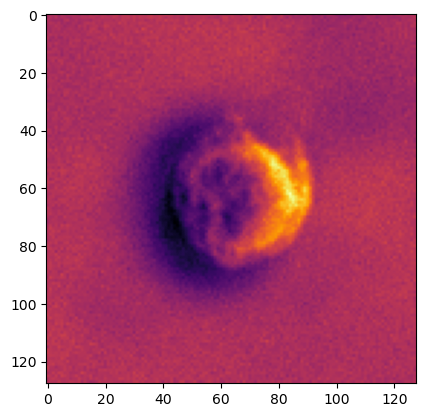

In [5]:
an_index = valid_indices[1]
image = dataset.read_image(an_index, channel='DPC_Left')
plt.imshow(image, cmap='inferno')

In [6]:
# Load the indices of the images and their labels (for the three class version)
indices, class_labels = dataset.get_cell_type_classification_data(ten_class_version=False)

def get_image_dimensions(dataset):
    dimensions = {}
    
    class_indices = indices[class_labels == 0]
    # Get the image at the current index
    img = dataset.read_image(np.random.choice(class_indices), channel='Brightfield')

    if img is not None:
        # Get the shape of the image
        if len(img.shape) == 3:
            y, x, _ = img.shape  # For color images
        else:
            y, x = img.shape  # For grayscale images

        dimensions[0] = (y, x)

    return dimensions



image_dimensions = get_image_dimensions(dataset)

# Print dimensions for each image
for index, (y, x) in image_dimensions.items():
    print(f"Image {index}: {y} rows x {x} columns")


Image 0: 128 rows x 128 columns


For all LED array images, the data are 128x128 pixels and have uint16 data type. However, they were collected on a 12 bit camera and thus have an intensity range from 0 to 4095.

Given below are 6 random 'Brightfield' images from te 3 class labels present in the dataset.

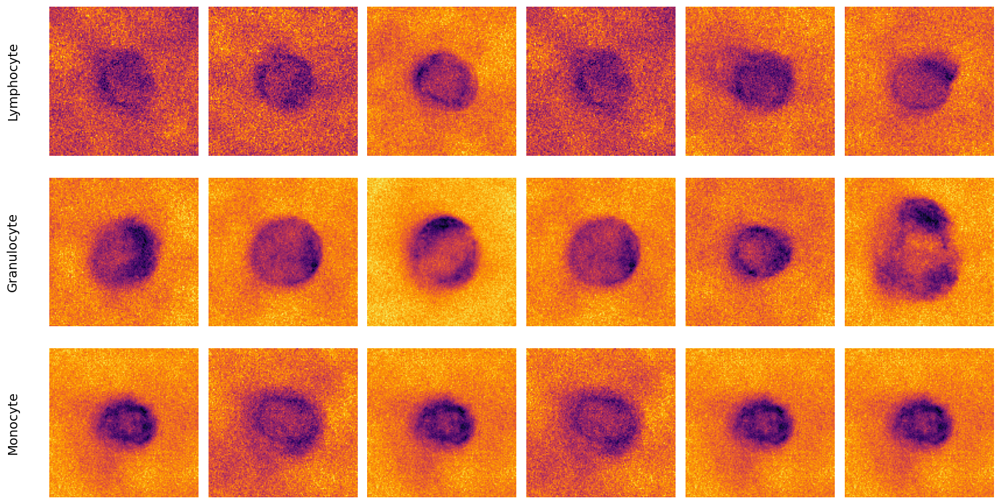

In [7]:
# Load the indices of the images and their labels (for the three class version)
indices, class_labels = dataset.get_cell_type_classification_data(ten_class_version=False)

# Show 6 examples of each class in three rows
fig, axs = plt.subplots(3, 6, figsize=(15, 8))
for i in range(3):
    for j in range(6):
        # Get the indices of the images in the current class
        class_indices = indices[class_labels == i]
        # Get the image at the current index
        image = dataset.read_image(np.random.choice(class_indices), channel='Brightfield')
        # Plot the image in the corresponding subplot
        axs[i, j].imshow(image, cmap='inferno')
        axs[i, j].axis('off')
# Add label
for i, label in enumerate(['Lymphocyte', 'Granulocyte', 'Monocyte']):
    axs[i, 0].text(-0.2, 0.5, label, fontsize=14, ha='right', va='center', transform=axs[i, 0].transAxes, rotation=90)

plt.tight_layout()

Fluorescence, which depending on the the sub-dataset either measures the light coming from one or more surface markers, or the cell's autofluorescence. This raw data can be processed to make more information measurements of surface marker expression

In [8]:
print('Fluorescence channels:')
channel_names = ['Brightfield']
for name in dataset.global_metadata['fluorescence']['channel_names']:
    channel_names.append(name)
    print(name)

Fluorescence channels:
Fluor_690-
Fluor_627-673
Fluor_585-625
Fluor_550-570
Fluor_500-550
Fluor_426-446


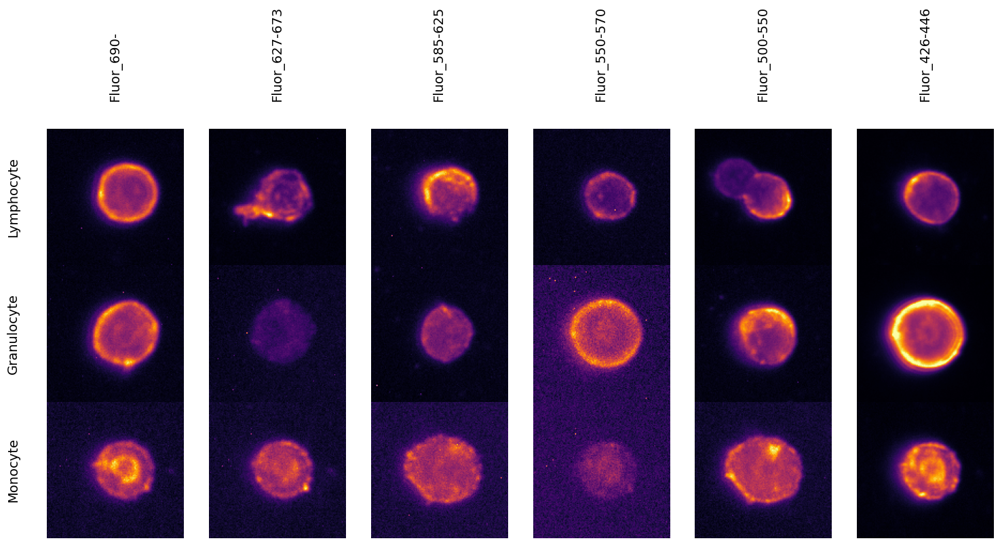

In [9]:
# Load the indices of the images and their labels (for the three class version)
indices, class_labels = dataset.get_cell_type_classification_data(ten_class_version=False)

# Show 6 examples of each class in three rows
fig, axs = plt.subplots(3, 6, figsize=(15, 8))
for i in range(3):
    # Get the indices of the images in the current class
    class_indices = indices[class_labels == i]
    # Get the image at the current index
    image_channel1 = dataset.read_image(np.random.choice(class_indices), channel='Fluor_690-')
    image_channel2 = dataset.read_image(np.random.choice(class_indices), channel='Fluor_627-673')
    image_channel3 = dataset.read_image(np.random.choice(class_indices), channel='Fluor_585-625')
    image_channel4 = dataset.read_image(np.random.choice(class_indices), channel='Fluor_550-570')
    image_channel5 = dataset.read_image(np.random.choice(class_indices), channel='Fluor_500-550')
    image_channel6 = dataset.read_image(np.random.choice(class_indices), channel='Fluor_426-446')
    # Plot the image in the corresponding subplot
    axs[i, 0].imshow(image_channel1, cmap='inferno')
    axs[i, 0].axis('off')
    axs[i, 1].imshow(image_channel2, cmap='inferno')
    axs[i, 1].axis('off')
    axs[i, 2].imshow(image_channel3, cmap='inferno')
    axs[i, 2].axis('off')
    axs[i, 3].imshow(image_channel4, cmap='inferno')
    axs[i, 3].axis('off')
    axs[i, 4].imshow(image_channel5, cmap='inferno')
    axs[i, 4].axis('off')
    axs[i, 5].imshow(image_channel6, cmap='inferno')
    axs[i, 5].axis('off')
# Add label
for i, label in enumerate(['Lymphocyte', 'Granulocyte', 'Monocyte']):
    axs[i, 0].text(-0.2, 0.5, label, fontsize=14, ha='right', va='center', transform=axs[i, 0].transAxes, rotation=90)
    
for j, label in enumerate(['Fluor_690-', 'Fluor_627-673', 'Fluor_585-625', 'Fluor_550-570', 'Fluor_500-550', 'Fluor_426-446']):
    axs[0,j].text(0.5, 1.2, label, fontsize=14, ha = 'center', va='bottom', transform = axs[0,j].transAxes, rotation=90)

plt.tight_layout()

**Number of Images in each channel**

Global metadata also contains a bunch of other useful information like pixel size, exposure, etc

In [10]:
import os
import cv2
import numpy as np

def count_images_by_channel(dataset, target_channel):
    count = 0
    for index in valid_indices:
            img = dataset.read_image(index, channel = target_channel)
            
            if img is not None:
                count += 1
    
    return count

for target_channel in dataset.global_metadata['fluorescence']['channel_names']:
    total_images = count_images_by_channel(dataset, target_channel)
    print(f"Total number of images in channel {target_channel}: {total_images}")

Total number of images in channel Fluor_690-: 1000
Total number of images in channel Fluor_627-673: 1000
Total number of images in channel Fluor_585-625: 1000
Total number of images in channel Fluor_550-570: 1000
Total number of images in channel Fluor_500-550: 1000
Total number of images in channel Fluor_426-446: 1000


In [11]:
for key in dataset.global_metadata['led_array'].keys():
    print(key)
    
print('The illumination wavelength is: {} nm'.format(dataset.global_metadata['led_array']['wavelength_nm']))

channel_names
channel_indices
exposure_ms
wavelength_nm
pixel_size_um
objective
The illumination wavelength is: 515 nm


In [12]:
print('The pixel size of images are: {}'.format(dataset.global_metadata['fluorescence']['pixel_size_um']))

The pixel size of images are: 0.166


In [13]:
dataset.global_metadata

{'name': 'BSCCM-tiny',
 'led_array': {'channel_names': ['Brightfield',
   'DF_50',
   'DF_50_Bottom',
   'DF_50_Right',
   'DF_55',
   'DF_60',
   'DF_60_Bottom',
   'DF_60_Right',
   'DF_65',
   'DF_70',
   'DF_70_Bottom',
   'DF_70_Right',
   'DF_75',
   'DF_80',
   'DF_80_Bottom',
   'DF_80_Right',
   'DF_85',
   'DF_90',
   'DPC_Bottom',
   'DPC_Left',
   'DPC_Right',
   'DPC_Top',
   'LED119'],
  'channel_indices': {'Brightfield': 0,
   'DF_50': 1,
   'DF_50_Bottom': 2,
   'DF_50_Right': 3,
   'DF_55': 4,
   'DF_60': 5,
   'DF_60_Bottom': 6,
   'DF_60_Right': 7,
   'DF_65': 8,
   'DF_70': 9,
   'DF_70_Bottom': 10,
   'DF_70_Right': 11,
   'DF_75': 12,
   'DF_80': 13,
   'DF_80_Bottom': 14,
   'DF_80_Right': 15,
   'DF_85': 16,
   'DF_90': 17,
   'DPC_Bottom': 18,
   'DPC_Left': 19,
   'DPC_Right': 20,
   'DPC_Top': 21,
   'LED119': 22},
  'exposure_ms': {'Brightfield': 8,
   'DF_50': 29,
   'DF_50_Bottom': 58,
   'DF_50_Right': 58,
   'DF_55': 46,
   'DF_60': 62,
   'DF_60_Bottom'

In [14]:
for key in dataset.global_metadata.keys():
    print(key)

name
led_array
fluorescence
histology


In [15]:

# Show the surface_marker_dataframe dataframe
surface_marker_df = dataset.surface_marker_dataframe
dataset.surface_marker_dataframe

,Fluor_690-_total_raw,Fluor_690-_background,Fluor_627-673_total_raw,Fluor_627-673_background,Fluor_585-625_total_raw,Fluor_585-625_background,Fluor_550-570_total_raw,Fluor_550-570_background,Fluor_500-550_total_raw,Fluor_500-550_background,...,selection_gated_CD3_hi_CD_16_lo,selection_gated_CD16_hi_CD45_mid,selection_gated_CD16_hi_CD45_lomid,selection_gated_CD16_hi_CD45_lo,selection_gated_CD16_lo_CD45_lo,selection_gated_CD16_none_CD45_mid_and_hi,selection_gated_CD45_mid_CD_16_mid,selection_gated_CD45_hi_CD_16_lo,selection_gated_CD45_hi_CD_16_mid,selection_gated_CD45_hi_CD_16_hi
global_index,,,,,,,,,,,,,,,,,,,,,
30,80.280174,74.017822,92.825745,82.036209,78.291771,68.508064,53.840534,51.594341,122.134407,105.219803,...,False,False,False,False,False,False,False,False,False,False
281,84.439026,73.766899,96.709938,82.201134,83.121490,72.188400,55.668068,53.734089,122.852676,107.512589,...,False,False,False,False,False,False,False,False,False,False
307,83.524712,79.544556,104.874077,97.363228,94.569847,86.727585,60.379017,58.560394,145.880920,132.351624,...,False,False,False,False,False,False,False,False,False,False
584,76.998756,73.875816,100.921631,93.973412,85.801308,79.386421,62.139389,60.737484,134.319244,123.203392,...,False,False,False,False,False,False,False,False,False,False
1451,77.841934,75.459969,106.318001,100.236778,95.188652,88.820366,58.627598,56.944553,145.752975,135.340027,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
410573,75.203903,73.607918,76.442604,71.296745,64.858589,59.111740,54.230991,52.704102,97.927544,88.430550,...,False,False,False,False,False,False,False,False,False,False
411302,71.616470,70.108345,79.173630,73.205658,62.052612,55.347382,56.207485,54.568600,102.358704,91.409050,...,False,False,False,False,False,False,False,False,False,False
411912,72.948479,71.917114,73.403297,69.991234,62.044205,58.000565,53.103512,51.872417,95.794693,89.078644,...,False,False,False,False,False,False,False,False,False,False


In [16]:
surface_marker_df.reset_index()

,global_index,Fluor_690-_total_raw,Fluor_690-_background,Fluor_627-673_total_raw,Fluor_627-673_background,Fluor_585-625_total_raw,Fluor_585-625_background,Fluor_550-570_total_raw,Fluor_550-570_background,Fluor_500-550_total_raw,...,selection_gated_CD3_hi_CD_16_lo,selection_gated_CD16_hi_CD45_mid,selection_gated_CD16_hi_CD45_lomid,selection_gated_CD16_hi_CD45_lo,selection_gated_CD16_lo_CD45_lo,selection_gated_CD16_none_CD45_mid_and_hi,selection_gated_CD45_mid_CD_16_mid,selection_gated_CD45_hi_CD_16_lo,selection_gated_CD45_hi_CD_16_mid,selection_gated_CD45_hi_CD_16_hi
0,30,80.280174,74.017822,92.825745,82.036209,78.291771,68.508064,53.840534,51.594341,122.134407,...,False,False,False,False,False,False,False,False,False,False
1,281,84.439026,73.766899,96.709938,82.201134,83.121490,72.188400,55.668068,53.734089,122.852676,...,False,False,False,False,False,False,False,False,False,False
2,307,83.524712,79.544556,104.874077,97.363228,94.569847,86.727585,60.379017,58.560394,145.880920,...,False,False,False,False,False,False,False,False,False,False
3,584,76.998756,73.875816,100.921631,93.973412,85.801308,79.386421,62.139389,60.737484,134.319244,...,False,False,False,False,False,False,False,False,False,False
4,1451,77.841934,75.459969,106.318001,100.236778,95.188652,88.820366,58.627598,56.944553,145.752975,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,410573,75.203903,73.607918,76.442604,71.296745,64.858589,59.111740,54.230991,52.704102,97.927544,...,False,False,False,False,False,False,False,False,False,False
996,411302,71.616470,70.108345,79.173630,73.205658,62.052612,55.347382,56.207485,54.568600,102.358704,...,False,False,False,False,False,False,False,False,False,False
997,411912,72.948479,71.917114,73.403297,69.991234,62.044205,58.000565,53.103512,51.872417,95.794693,...,False,False,False,False,False,False,False,False,False,False
998,412320,67.802551,66.449791,75.414505,70.495331,66.003502,60.283451,53.788311,52.431118,105.068413,...,False,False,False,False,False,False,False,False,False,False


This dataframe contains many columns, including raw fluorescence measurements, shading-corrected fluorescence (i.e. corrected for position in field of view), demixed surface marker measurements, and many intermediates used in this processing. Here, we highlight two particularly useful parts, the shading-corrected fluorescence, and the demixed surface marker estimates.

These can both be accessed with another two convenience functions, the first of which is:

In [17]:
has_surfacemarker_columns = surface_marker_df.keys()
has_surfacemarker_columns

Index(['Fluor_690-_total_raw', 'Fluor_690-_background',
       'Fluor_627-673_total_raw', 'Fluor_627-673_background',
       'Fluor_585-625_total_raw', 'Fluor_585-625_background',
       'Fluor_550-570_total_raw', 'Fluor_550-570_background',
       'Fluor_500-550_total_raw', 'Fluor_500-550_background',
       'Fluor_426-446_total_raw', 'Fluor_426-446_background',
       'Fluor_426-446_background_lowess', 'Fluor_500-550_background_lowess',
       'Fluor_550-570_background_lowess', 'Fluor_585-625_background_lowess',
       'Fluor_627-673_background_lowess', 'Fluor_690-_background_lowess',
       'Fluor_426_shading', 'Fluor_426-446_shading',
       'Fluor_426-446_shading_corrected', 'Fluor_500-550_shading',
       'Fluor_500-550_shading_corrected', 'Fluor_550-570_shading',
       'Fluor_550-570_shading_corrected', 'Fluor_585-625_shading',
       'Fluor_585-625_shading_corrected', 'Fluor_627-673_shading',
       'Fluor_627-673_shading_corrected', 'Fluor_690-_shading',
       'Fluor_690-_sh

In [18]:
# Get the indices of cells in batch 0 with no antibody stains
global_indices = dataset.get_indices(batch=0, antibodies='unstained')
fluor = dataset.get_corrected_fluor(global_indices)

Fluor is an N by 6 matrix, where N is the number of cells and 6 is the number of fluorescent channels. Since we specifically picked 'unstained' cells, this fluorescence corrsponds to the cell's inherent autofluorescence 

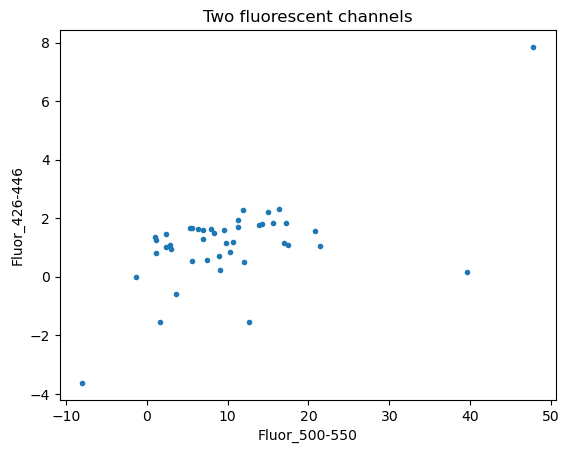

In [19]:
plt.plot(fluor[:, 4], fluor[:, 5], '.')
_ = plt.title('Two fluorescent channels')
_ = plt.xlabel(dataset.global_metadata['fluorescence']['channel_names'][4])
_ = plt.ylabel(dataset.global_metadata['fluorescence']['channel_names'][5])

# **Extracting the brightfield and fluorescence images alone and storing in a separate file**

In [20]:
import h5py
import numpy as np

def store_fluor_images(dataset, global_indices, fluor, output_file='fluor_images.h5'):
    with h5py.File(output_file, 'w') as f:
        num_images, num_channels = fluor.shape
        
        
        
        image_shape = (128, 128)  
        
        # Create a dataset for storing images
        images_dataset = f.create_dataset(
            'images',
            shape=(num_images, num_channels+1, *image_shape), # Number of channels is incremented by one to store the brightfield images
            dtype=np.uint16  # Use uint16 to match the original datatype
        )

        # Store the images in the HDF5 file
        for i, index in enumerate(global_indices):
            for j, name in enumerate(channel_names):
                # Read the image for the specific index and channel
                img = dataset.read_image(index, channel=name)
                
                # Ensure the image is in uint16 format
                img_uint16 = img.astype(np.uint16)
                
                # Store the image
                images_dataset[i, j] = img_uint16

        # Store metadata
        f.attrs['num_images'] = num_images
        f.attrs['num_channels'] = num_channels
        f.attrs['image_shape'] = image_shape
        f.attrs['datatype'] = 'uint16'

    print(f"All images have been stored in '{output_file}' with uint16 datatype")

# Usage

store_fluor_images(dataset, global_indices, fluor)

All images have been stored in 'fluor_images.h5' with uint16 datatype


In [21]:
'''
import h5py
import numpy as np
import matplotlib.pyplot as plt

def display_images_from_hdf5(file_path, num_images_to_display=12):
    with h5py.File(file_path, 'r') as f:
        # Access the dataset
        images_dataset = f['images']
        num_images, num_channels, height, width = images_dataset.shape
        print(images_dataset.shape)
        
        print(f"Dataset contains {num_images} images with {num_channels} channels each, of size {height}x{width}.")

        # Display the first few images
        plt.figure(figsize=(20, 20))
        for i in range(min(num_images_to_display, num_images)):
            
            for j in range(num_channels):
                img = images_dataset[i, j]
                plt.subplot(num_images_to_display, num_channels, i * num_channels + j + 1)
                plt.imshow(img, cmap='inferno')
                plt.title(f'Image {i}, Channel {j}')
                plt.axis('off')
            
        plt.show()
        return images_dataset

# Usage
file_path = 'fluor_images.h5'
images_dataset = display_images_from_hdf5(file_path)

'''

'\nimport h5py\nimport numpy as np\nimport matplotlib.pyplot as plt\n\ndef display_images_from_hdf5(file_path, num_images_to_display=12):\n    with h5py.File(file_path, \'r\') as f:\n        # Access the dataset\n        images_dataset = f[\'images\']\n        num_images, num_channels, height, width = images_dataset.shape\n        print(images_dataset.shape)\n        \n        print(f"Dataset contains {num_images} images with {num_channels} channels each, of size {height}x{width}.")\n\n        # Display the first few images\n        plt.figure(figsize=(20, 20))\n        for i in range(min(num_images_to_display, num_images)):\n            \n            for j in range(num_channels):\n                img = images_dataset[i, j]\n                plt.subplot(num_images_to_display, num_channels, i * num_channels + j + 1)\n                plt.imshow(img, cmap=\'inferno\')\n                plt.title(f\'Image {i}, Channel {j}\')\n                plt.axis(\'off\')\n            \n        plt.show(

(16338, 7, 128, 128)
Dataset contains 16338 images with 7 channels each, of size 128x128.


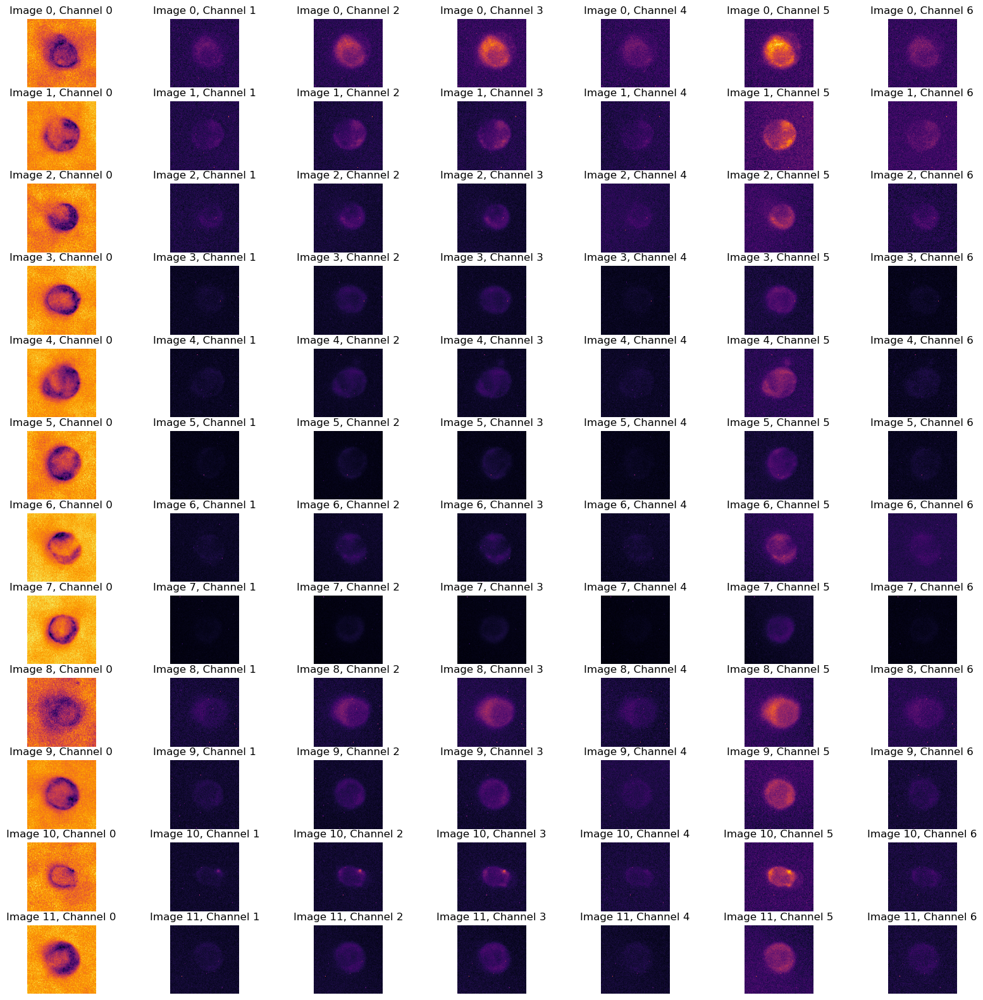

Original dataset shape: (16338, 7, 128, 128)
Transposed dataset shape: (16338, 128, 128, 7)
Transposed dataset saved to fluor_images_transposed.h5
(16338, 128, 128, 7)
Dataset contains 16338 images with 7 channels each, of size 128x128.


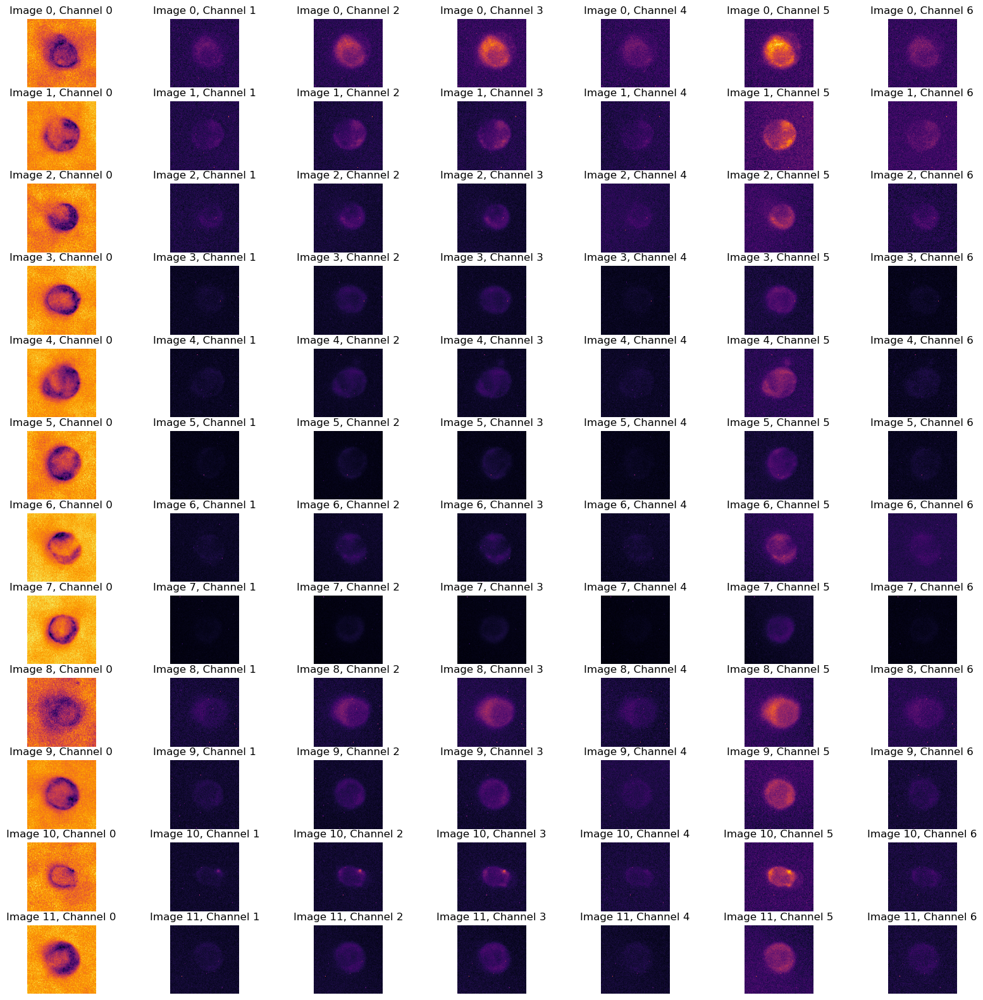

In [46]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

def display_images_from_hdf5(file_path, num_images_to_display=12):
    with h5py.File(file_path, 'r') as f:
        # Access the dataset
        images_dataset = f['images']
        num_images, num_channels, height, width = images_dataset.shape
        print(images_dataset.shape)
        
        print(f"Dataset contains {num_images} images with {num_channels} channels each, of size {height}x{width}.")

        # Display the first few images
        plt.figure(figsize=(20, 20))
        for i in range(min(num_images_to_display, num_images)):
            for j in range(num_channels):
                img = images_dataset[i, j]
                plt.subplot(num_images_to_display, num_channels, i * num_channels + j + 1)
                plt.imshow(img, cmap='inferno')
                plt.title(f'Image {i}, Channel {j}')
                plt.axis('off')
            
        plt.show()
        return images_dataset
    
def display_transposedimages_from_hdf5(file_path, num_images_to_display=12):
    with h5py.File(file_path, 'r') as f:
        # Access the dataset
        images_dataset = f['images']
        num_images, height, width, num_channels = images_dataset.shape
        print(images_dataset.shape)
        
        print(f"Dataset contains {num_images} images with {num_channels} channels each, of size {height}x{width}.")

        # Display the first few images
        
        plt.figure(figsize=(20, 20))
        for i in range(min(num_images_to_display, num_images)):
            for j in range(images_dataset.shape[-1]):  # Loop over channels in NHWC format
                img = images_dataset[i, :, :, j]
                plt.subplot(num_images_to_display, images_dataset.shape[-1], i * images_dataset.shape[-1] + j + 1)
                plt.imshow(img, cmap='inferno')
                plt.title(f'Image {i}, Channel {j}')
                plt.axis('off')
            
        plt.show()
        return images_dataset

def convert_and_store_images(input_file_path, output_file_path):
    with h5py.File(input_file_path, 'r') as f:
        # Access the dataset
        images_dataset = f['images']
        num_images, num_channels, height, width = images_dataset.shape
        print(f"Original dataset shape: {images_dataset.shape}")

        # Load the dataset into a numpy array
        images_array = np.array(images_dataset)
        
        # Transpose the dataset from NCHW to NHWC
        images_transposed = images_array.transpose(0, 2, 3, 1)
        print(f"Transposed dataset shape: {images_transposed.shape}")

        # Save the transposed dataset to a new HDF5 file
        with h5py.File(output_file_path, 'w') as f_out:
            f_out.create_dataset('images', data=images_transposed, dtype=images_transposed.dtype)
            print(f"Transposed dataset saved to {output_file_path}")

# Usage
input_file_path = 'fluor_images.h5'
output_file_path = 'fluor_images_transposed.h5'

# Display images from the original dataset
images_dataset = display_images_from_hdf5(input_file_path)

# Convert and store the images in NHWC format
convert_and_store_images(input_file_path, output_file_path)

# Display images from the transposed dataset
images_dataset_transposed = display_transposedimages_from_hdf5(output_file_path)


In [47]:
from keras import backend as K
K.set_image_data_format('channels_last')

# PatchGAN Discriminator

In [48]:
# example of defining a 70x70 patchgan discriminator model
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import BatchNormalization
#from keras.utils import plot_model

# define the discriminator model
def define_discriminator(image_shape):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # source image input
    in_src_image = Input(shape=image_shape)
    # target image input
    in_target_image = Input(shape=image_shape)
    # concatenate images channel-wise
    merged = Concatenate()([in_src_image, in_target_image])
    # C64
    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init, data_format='channels_last')(merged)
    d = LeakyReLU(alpha=0.2)(d)
    # C128
    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init, data_format='channels_last')(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C256
    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init, data_format='channels_last')(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C512
    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init, data_format='channels_last')(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # second last output layer
    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init, data_format='channels_last')(d)
    d = BatchNormalization()(d)
    d = LeakyReLU(alpha=0.2)(d)
    # patch output
    d = Conv2D(1, (4,4), padding='same', kernel_initializer=init, data_format='channels_last')(d)
    patch_out = Activation('sigmoid')(d)
    # define model
    model = Model([in_src_image, in_target_image], patch_out)
    # compile model
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

# define image shape
image_shape = (128, 128, 7)
# create the model
model = define_discriminator(image_shape)
# summarize the model
model.summary()
# plot the model
#plot_model(model, to_file='discriminator_model_plot.png', show_shapes=True, show_layer_names=True)

/Users/anagharamadas/anaconda3/envs/GPU/lib/python3.11/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 7)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_8       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 7)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_14      │ (None, 128, 128,  │          0 │ input_layer_7[0]… │
│ (Concatenate)       │ 14)               │            │ input_layer_8[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_26 (Conv2D)  │ (None, 64, 64,    │     14,400 │ concatenate_14[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_22      │ (None, 64, 64,    │          0 │ conv2d_26[0][0]   │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_27 (Conv2D)  │ (None, 32, 32,    │    131,200 │ leaky_re_lu_22[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        512 │ conv2d_27[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_23      │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_28 (Conv2D)  │ (None, 16, 16,    │    524,544 │ leaky_re_lu_23[0… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │      1,024 │ conv2d_28[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_24      │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_29 (Conv2D)  │ (None, 8, 8, 512) │  2,097,664 │ leaky_re_lu_24[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 8, 8, 512) │      2,048 │ conv2d_29[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_25      │ (None, 8, 8, 512) │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_30 (Conv2D)  │ (None, 8, 8, 512) │  4,194,816 │ leaky_re_lu_25[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 8, 8, 512) │      2,048 │ conv2d_30[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_26      │ (None, 8, 8, 512) │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 6,976,449 (26.61 MB)

 Trainable params: 6,973,633 (26.60 MB)

 Non-trainable params: 2,816 (11.00 KB)

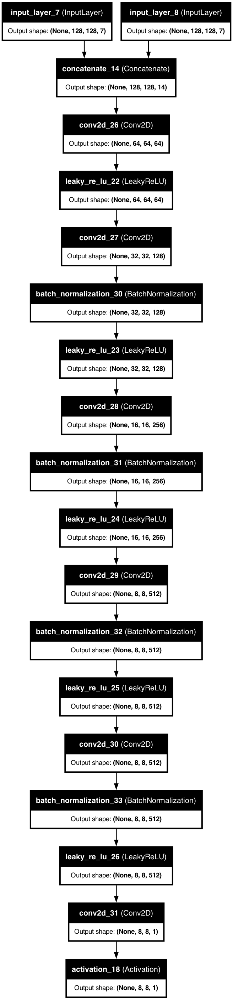

In [49]:
from tensorflow.keras.utils import plot_model
import tensorflow as tf

# After defining your model
tf.keras.utils.plot_model(
    model,
    to_file="discriminator_model_plot.png",
    show_shapes=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=True,
    dpi=96,
)

# U-Net Generator

In [50]:
# example of defining a u-net encoder-decoder generator model
from keras.initializers import RandomNormal
from keras.models import Model
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from keras.layers import LeakyReLU
#from keras.utils.vis_utils import plot_model

# define an encoder block
def define_encoder_block(layer_in, n_filters, batchnorm=True):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # add downsampling layer
    g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init, data_format='channels_last')(layer_in)
    # conditionally add batch normalization
    if batchnorm:
        g = BatchNormalization()(g, training=True)
    # leaky relu activation
    g = LeakyReLU(alpha=0.2)(g)
    return g

# define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # add upsampling layer
    g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init, data_format='channels_last')(layer_in)
    # add batch normalization
    g = BatchNormalization()(g, training=True)
    # conditionally add dropout
    if dropout:
        g = Dropout(0.5)(g, training=True)
    # merge with skip connection
    g = Concatenate()([g, skip_in])
    # relu activation
    g = Activation('relu')(g)
    return g

# define the standalone generator model
def define_generator(image_shape=(128, 128, 7)):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # image input
    in_image = Input(shape=image_shape)
    # encoder model: C64-C128-C256-C512-C512-C512-C512-C512
    e1 = define_encoder_block(in_image, 64, batchnorm=False)
    e2 = define_encoder_block(e1, 128)
    e3 = define_encoder_block(e2, 256)
    e4 = define_encoder_block(e3, 512)
    e5 = define_encoder_block(e4, 512)
    e6 = define_encoder_block(e5, 512)
    #e7 = define_encoder_block(e6, 512)
    # bottleneck, no batch norm and relu
    b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init, data_format='channels_last')(e6)
    b = Activation('relu')(b)
    # decoder model: CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128
    d1 = decoder_block(b, e6, 512)
    d2 = decoder_block(d1, e5, 512)
    d3 = decoder_block(d2, e4, 512)
    #d4 = decoder_block(d3, e4, 512, dropout=False)
    d4 = decoder_block(d3, e3, 256, dropout=False)
    d5 = decoder_block(d4, e2, 128, dropout=False)
    d6 = decoder_block(d5, e1, 64, dropout=False)
    # output
    g = Conv2DTranspose(7, (4,4), strides=(2,2), padding='same', kernel_initializer=init, data_format='channels_last')(d6)
    out_image = Activation('tanh')(g)
    # define model
    model = Model(in_image, out_image)
    return model

# define image shape
image_shape = (128, 128, 7)
# create the model
model = define_generator(image_shape)
# summarize the model
model.summary()
# plot the model
#plot_model(model, to_file='generator_model_plot.png', show_shapes=True, show_layer_names=True)

/Users/anagharamadas/anaconda3/envs/GPU/lib/python3.11/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 7)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_32 (Conv2D)  │ (None, 64, 64,    │      7,232 │ input_layer_9[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_27      │ (None, 64, 64,    │          0 │ conv2d_32[0][0]   │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_33 (Conv2D)  │ (None, 32, 32,    │    131,200 │ leaky_re_lu_27[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        512 │ conv2d_33[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_28      │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_34 (Conv2D)  │ (None, 16, 16,    │    524,544 │ leaky_re_lu_28[0… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │      1,024 │ conv2d_34[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_29      │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_35 (Conv2D)  │ (None, 8, 8, 512) │  2,097,664 │ leaky_re_lu_29[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 8, 8, 512) │      2,048 │ conv2d_35[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_30      │ (None, 8, 8, 512) │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_36 (Conv2D)  │ (None, 4, 4, 512) │  4,194,816 │ leaky_re_lu_30[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 4, 4, 512) │      2,048 │ conv2d_36[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_31      │ (None, 4, 4, 512) │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_37 (Conv2D)  │ (None, 2, 2, 512) │  4,194,816 │ leaky_re_lu_31[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 2, 2, 512) │      2,048 │ conv2d_37[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_32      │ (None, 2, 2, 512) │          0 │ batch_normalizat

 Total params: 41,853,575 (159.66 MB)

 Trainable params: 41,845,767 (159.63 MB)

 Non-trainable params: 7,808 (30.50 KB)

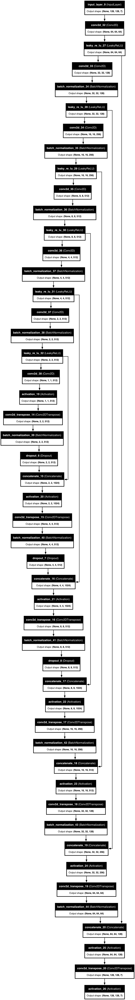

In [51]:
from tensorflow.keras.utils import plot_model
import tensorflow as tf

# After defining your model
tf.keras.utils.plot_model(
    model,
    to_file="generator_model_plot.png",
    show_shapes=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=True,
    dpi=96
)

In [52]:

# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model, image_shape):
 # make weights in the discriminator not trainable
 for layer in d_model.layers:
     if not isinstance(layer, BatchNormalization):
         layer.trainable = False
 # define the source image
 in_src = Input(shape=image_shape)
 # connect the source image to the generator input
 gen_out = g_model(in_src)
 # connect the source input and generator output to the discriminator input
 dis_out = d_model([in_src, gen_out])
 # src image as input, generated image and classification output
 model = Model(in_src, [dis_out, gen_out])
 # compile model
 opt = Adam(learning_rate=0.0002, beta_1=0.5)
 model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1,100])
 return model

/Users/anagharamadas/anaconda3/envs/GPU/lib/python3.11/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 7)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_17       │ (None, 128, 128,  │ 41,853,575 │ input_layer_13[0… │
│ (Functional)        │ 7)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_15       │ (None, 8, 8, 1)   │  6,976,449 │ input_layer_13[0… │
│ (Functional)        │                   │            │ functional_17[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 48,830,024 (186.27 MB)

 Trainable params: 41,848,583 (159.64 MB)

 Non-trainable params: 6,981,441 (26.63 MB)

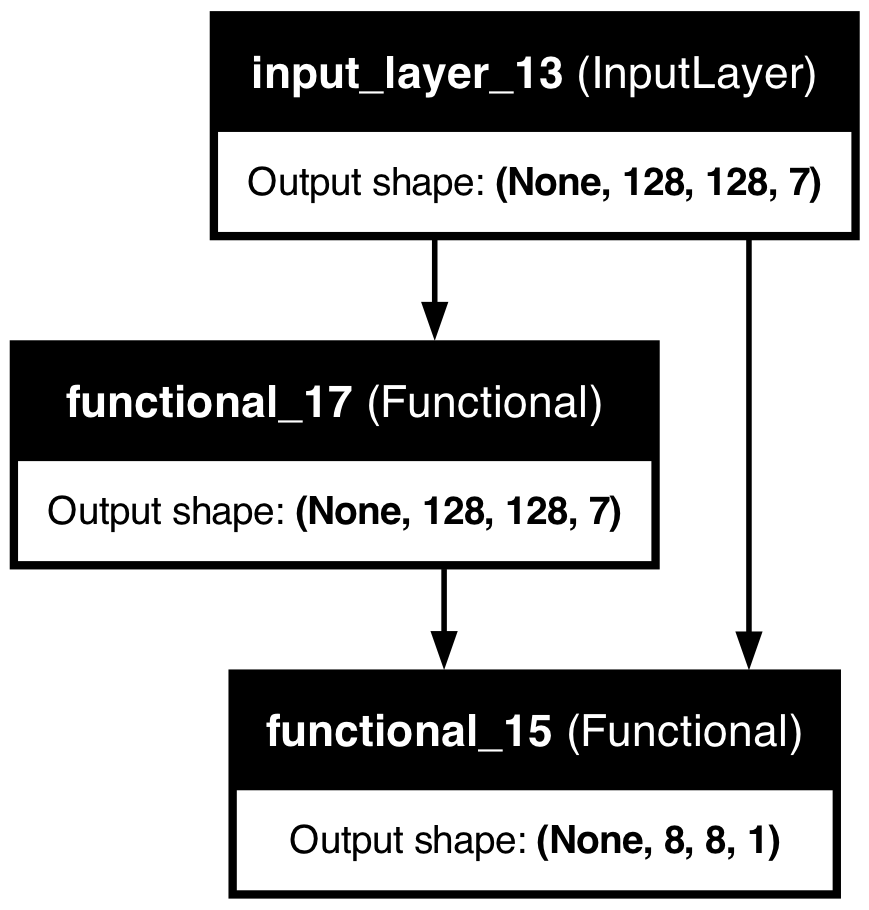

In [53]:
# define image shape
image_shape = (128, 128, 7)
# define the models
d_model = define_discriminator(image_shape)
g_model = define_generator(image_shape)
# define the composite model
gan_model = define_gan(g_model, d_model, image_shape)
# summarize the model
gan_model.summary()
# plot the model
plot_model(gan_model, to_file='gan_model_plot.png', show_shapes=True, show_layer_names=True)

# Updating the model weights

In [87]:

import numpy as np
from numpy.random import randint
from numpy import ones
from numpy import zeros

def split_dataset(dataset):
    # Check the dimensions of the dataset
    if dataset.shape != (16338, 128, 128, 7):
        raise ValueError('Dataset dimensions do not match the expected shape (43, 128, 128, 7)')
    
    # Split the dataset into trainA and trainB
    mid_point = dataset.shape[0] // 2
    trainA = dataset[:100]
    trainB = dataset[-100:]
    
    return trainA, trainB



In [88]:
# select a batch of random samples, returns images and target
def generate_real_samples(dataset, n_samples, patch_shape):
    # unpack dataset
    trainA, trainB = split_dataset(dataset)
    print('trainA shape:', trainA.shape)
    print('trainB shape:', trainB.shape)
    # choose random instances
    ix = randint(0, trainA.shape[0], n_samples)
    # retrieve selected images
    X1, X2 = trainA[ix], trainB[ix]
    # generate 'real' class labels (1)
    y = np.ones((n_samples, patch_shape, patch_shape, 1))
    return [X1, X2], y

In [89]:
# generate a batch of images, returns images and targets
def generate_fake_samples(g_model, samples, patch_shape): 
    # Ensure samples are in channels_last format
    if samples.shape[-1] != 7:  # Assuming 7 channels
        samples = samples.transpose(0, 2, 3, 1)
    # generate fake instance
    X = g_model.predict(samples)
    # create 'fake' class labels (0)
    y = np.zeros((len(X),patch_shape, patch_shape, 1))
    return X, y

In [90]:
def check_dataset_format(file_path):
    with h5py.File(file_path, 'r') as f:
        # Access the dataset
        images_dataset = f['images']
        num_images, height, width, num_channels = images_dataset.shape
        print(f"Dataset shape: {images_dataset.shape}")
        print(f"Dataset contains {num_images} images with {num_channels} channels each, of size {height}x{width}.")
        
        # Verify the datatype
        datatype = images_dataset.dtype
        print(f"Image datatype: {datatype}")

        # Check if the dataset follows NHWC format
        if len(images_dataset.shape) == 4 and images_dataset.shape[1] == height and images_dataset.shape[2] == width and images_dataset.shape[3] == num_channels:
            print("Dataset follows NHWC format.")
        else:
            print("Dataset does not follow NHWC format.")
        
        return images_dataset

# Usage
file_path = 'fluor_images_transposed.h5'
images_dataset = check_dataset_format(file_path)

Dataset shape: (16338, 128, 128, 7)
Dataset contains 16338 images with 7 channels each, of size 128x128.
Image datatype: uint16
Dataset follows NHWC format.


In [91]:
n_batch = 1
n_patch = 8
print(images_dataset.shape)
file_path = 'fluor_images_transposed.h5'

# Open the file and keep it open
f = h5py.File(file_path, 'r')
images_dataset = f['images']
# select a batch of real samples
[X_realA, X_realB], y_real = generate_real_samples(images_dataset, n_batch, n_patch)
print(X_realA.shape)
print(X_realB.shape)
print(y_real.shape)

(16338, 128, 128, 7)
trainA shape: (100, 128, 128, 7)
trainB shape: (100, 128, 128, 7)
(1, 128, 128, 7)
(1, 128, 128, 7)
(1, 8, 8, 1)


In [92]:
...

# generate a batch of fake samples
X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


In [93]:
print("X_realA shape:", X_realA.shape)
print("X_realB shape:", X_realB.shape)
print("y_real shape:", y_real.shape)
print("X_fakeB shape:", X_fakeB.shape)
print("y_fake shape:", y_fake.shape)

X_realA shape: (1, 128, 128, 7)
X_realB shape: (1, 128, 128, 7)
y_real shape: (1, 8, 8, 1)
X_fakeB shape: (1, 128, 128, 7)
y_fake shape: (1, 8, 8, 1)


In [94]:
# Get the discriminator's output for the generated images
disc_generated_output = d_model([X_realA, X_fakeB])

In [95]:

# Example model compilation for multiple outputs
d_model.compile(optimizer='Adam', loss='binary_crossentropy')
d_model.trainable = False
# update discriminator for real samples
#d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
# update discriminator for generated samples
#d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)


In [96]:
#print(f"Discriminator loss on real samples: {d_loss1}")
#print(f"Discriminator loss on fake samples: {d_loss2}")

In [97]:
# Assuming you have already defined and created the gan_model
# Define the optimizer and compile the GAN model
from keras.optimizers import SGD
 
opt = Adam(learning_rate=0.0002)
gan_model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1, 100])

X_realA = X_realA.astype(np.float32)
X_realB = X_realB.astype(np.float32)

X_realA = (X_realA - 127.5) / 127.5
X_realB = (X_realB - 127.5) / 127.5

# Now you can call train_on_batch
#g_loss = gan_model.train_on_batch(X_realA, [y_real, X_realB])
#print(f"Generator loss on fake samples: {g_loss}")

In [98]:
import tensorflow as tf

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, dataset, batch_size, patch_shape, generator_model):
        self.dataset = dataset
        self.batch_size = batch_size
        self.patch_shape = patch_shape
        self.generator_model = generator_model
        self.trainA, self.trainB = split_dataset(dataset)
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.trainA) / self.batch_size))

    def __getitem__(self, index):
        # Generate indexes of the batch
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        # Generate data
        X_realA, X_realB, y_real, X_fakeB, y_fake = self.__data_generation(indexes)
        return [X_realA, X_realB], [y_real, X_fakeB, y_fake]

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.trainA))
        np.random.shuffle(self.indexes)

    def __data_generation(self, indexes):
        # Generate real samples
        X_realA, X_realB = self.trainA[indexes], self.trainB[indexes]
        y_real = np.ones((self.batch_size, self.patch_shape, self.patch_shape, 1))
        
        # Generate fake samples
        X_fakeB = self.generator_model.predict(X_realA)
        y_fake = np.zeros((self.batch_size, self.patch_shape, self.patch_shape, 1))
        
        return X_realA, X_realB, y_real, X_fakeB, y_fake


In [99]:
# Assuming you have already defined and created the generator model (g_model)
batch_size = 16
patch_shape = 8  # Example patch shape, adjust as necessary
  # Example dataset, replace with actual data
epochs = 25
data_gen = DataGenerator(images_dataset, batch_size, patch_shape, g_model)

# Example of using the data generator with a GAN model
for epoch in range(epochs):
    for batch in range(len(data_gen)):
        [X_realA, X_realB], [y_real, X_fakeB, y_fake] = data_gen[batch]
        # Train the discriminator
        d_loss_real = d_model.train_on_batch([X_realA, X_realB], y_real)
        d_loss_fake = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
        # Train the generator
        g_loss = gan_model.train_on_batch(X_realA, [y_real, X_realB])
        print(f"Epoch: {epoch+1}, Batch: {batch+1}, D Loss Real: {d_loss_real}, D Loss Fake: {d_loss_fake}, G Loss: {g_loss}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
Epoch: 1, Batch: 1, D Loss Real: 5.673707485198975, D Loss Fake: 56.85529708862305, G Loss: 49591.59765625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
Epoch: 1, Batch: 2, D Loss Real: 39.82170486450195, D Loss Fake: 56.904998779296875, G Loss: 49494.7109375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
Epoch: 1, Batch: 3, D Loss Real: 46.670806884765625, D Loss Fake: 56.95021438598633, G Loss: 49584.96875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
Epoch: 1, Batch: 4, D Loss Real: 49.63821792602539, D Loss Fake: 56.951683044433594, G Loss: 49565.43359375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
Epoch: 1, Batch: 5, D Loss Real: 51.26102066040039, D Loss Fake: 56.966773986816406, G Loss: 49525.2734375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
Epoch: 1, Batch: 6, D Loss Real: 52.31886291503906, D Loss Fake: 57.0442008972168, G Loss: 49522.125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
Epoch: 2, Batch: 1, D Loss Real: 53.09262466430664, D Loss Fake: 57.0172119140625, G Loss: 4

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
Epoch: 8, Batch: 5, D Loss Real: 56.48454284667969, D Loss Fake: 57.03596496582031, G Loss: 49522.45703125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
Epoch: 8, Batch: 6, D Loss Real: 56.4970588684082, D Loss Fake: 57.04420471191406, G Loss: 49522.12109375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
Epoch: 9, Batch: 1, D Loss Real: 56.51461410522461, D Loss Fake: 57.04035186767578, G Loss: 49523.53515625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
Epoch: 9, Batch: 2, D Loss Real: 56.52231216430664, D Loss Fake: 57.038639068603516, G Loss: 49521.01953125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
Epoch: 9, Batch: 3, D Loss Real: 56.530670166015625, D Loss Fake: 57.038673400878906, G Loss: 49525.8125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
Epoch: 9, Batch: 4, D Loss Real: 56.5408821105957, D Loss Fake: 57.037086486816406, G Loss: 49525.4453125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
Epoch: 9, Batch: 5, D Loss Real: 56.54850387573242, D Loss Fake: 57.036895751953125, G L

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
Epoch: 16, Batch: 3, D Loss Real: 56.76385498046875, D Loss Fake: 57.04118728637695, G Loss: 49524.1328125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
Epoch: 16, Batch: 4, D Loss Real: 56.76699447631836, D Loss Fake: 57.040283203125, G Loss: 49523.953125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
Epoch: 16, Batch: 5, D Loss Real: 56.768829345703125, D Loss Fake: 57.04014205932617, G Loss: 49522.27734375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
Epoch: 16, Batch: 6, D Loss Real: 56.77207565307617, D Loss Fake: 57.04421615600586, G Loss: 49522.11328125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
Epoch: 17, Batch: 1, D Loss Real: 56.778045654296875, D Loss Fake: 57.04227066040039, G Loss: 49522.8359375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
Epoch: 17, Batch: 2, D Loss Real: 56.77925491333008, D Loss Fake: 57.041378021240234, G Loss: 49521.5625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
Epoch: 17, Batch: 3, D Loss Real: 56.78093719482422, D Loss Fake: 57.04137420654297, G

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
Epoch: 23, Batch: 6, D Loss Real: 56.855220794677734, D Loss Fake: 57.04423141479492, G Loss: 49522.1796875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
Epoch: 24, Batch: 1, D Loss Real: 56.85877990722656, D Loss Fake: 57.04287338256836, G Loss: 49522.68359375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
Epoch: 24, Batch: 2, D Loss Real: 56.859046936035156, D Loss Fake: 57.0422477722168, G Loss: 49521.79296875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
Epoch: 24, Batch: 3, D Loss Real: 56.859657287597656, D Loss Fake: 57.042236328125, G Loss: 49523.51953125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
Epoch: 24, Batch: 4, D Loss Real: 56.861053466796875, D Loss Fake: 57.041629791259766, G Loss: 49523.40625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
Epoch: 24, Batch: 5, D Loss Real: 56.861610412597656, D Loss Fake: 57.041526794433594, G Loss: 49522.296875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
Epoch: 24, Batch: 6, D Loss Real: 56.86312484741211, D Loss Fake: 57.044235229492

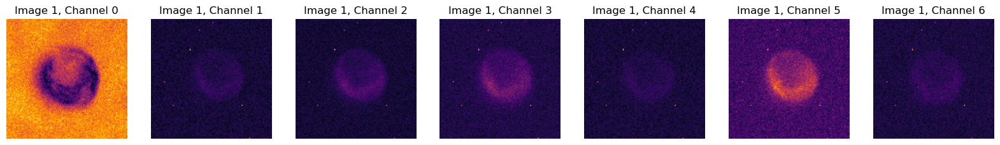

In [103]:

plt.figure(figsize=(20, 20))

for j in range(X_realA.shape[-1]):
    img = X_realA[0,:, :, j]
    plt.subplot(1, 7, 0 * 7 + j + 1)
    plt.imshow(img, cmap='inferno')
    plt.title(f'Image {1}, Channel {j}')
    plt.axis('off')

plt.show()


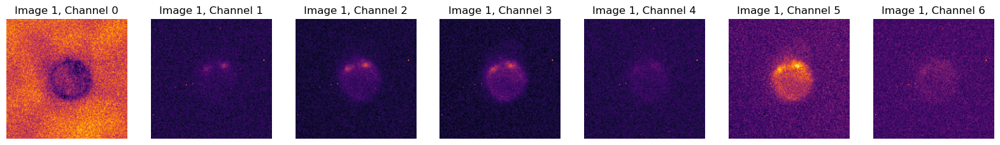

In [101]:
plt.figure(figsize=(20, 20))

for j in range(X_realB.shape[-1]):
    img = X_realB[0,:, :, j]
    plt.subplot(1, 7, 0 * 7 + j + 1)
    plt.imshow(img, cmap='inferno')
    plt.title(f'Image {1}, Channel {j}')
    plt.axis('off')

plt.show()

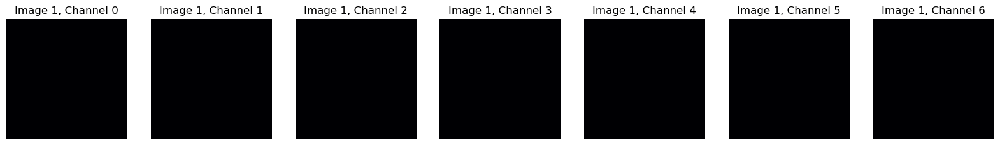

In [102]:

plt.figure(figsize=(20, 20))

for j in range(X_fakeB.shape[-1]):
    img = X_fakeB[0,:, :, j]
    plt.subplot(1, 7, 0 * 7 + j + 1)
    plt.imshow(img, cmap='inferno')
    plt.title(f'Image {1}, Channel {j}')
    plt.axis('off')

plt.show()
